---
---
---
---
# QC Plots
---
---
---
---

## **Quality Control and Preprocessing Overview**

This section performs quality control (QC) for single-cell RNA-seq data using Scanpy. It includes visualization of raw data metrics, statistical summaries, and filtering steps to remove low-quality cells. This ensures clean and interpretable input for downstream analyses such as clustering and differential expression.


In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
from anndata import AnnData
import pandas as pd
import numpy as np
import seaborn as sns
import math

adata = sc.read_h5ad("../nCoV_dataset_full.h5ad")

### **Visualizing Raw Quality Metrics**

This section generates violin plots of unfiltered data to assess QC features including total counts, number of genes per cell, and mitochondrial gene expression.


       n_genes_by_counts  total_counts
count       46022.000000  46022.000000
mean          814.039959   1774.544597
std           429.381440    408.142982
min           298.000000    780.045361
25%           559.000000   1489.566982
50%           717.000000   1726.779466
75%           946.000000   2012.330623
max          5993.000000   4213.337036
       n_genes_by_counts  total_counts  total_counts_mt  pct_counts_mt
count       46022.000000  46022.000000     46022.000000   46022.000000
mean          814.039959   1774.544597        20.537330       1.155392
std           429.381440    408.142982        10.133948       0.560477
min           298.000000    780.045361         0.000000       0.000000
25%           559.000000   1489.566982        12.681962       0.760052
50%           717.000000   1726.779466        20.010315       1.078060
75%           946.000000   2012.330623        27.662197       1.485755
max          5993.000000   4213.337036        60.184846       4.877690


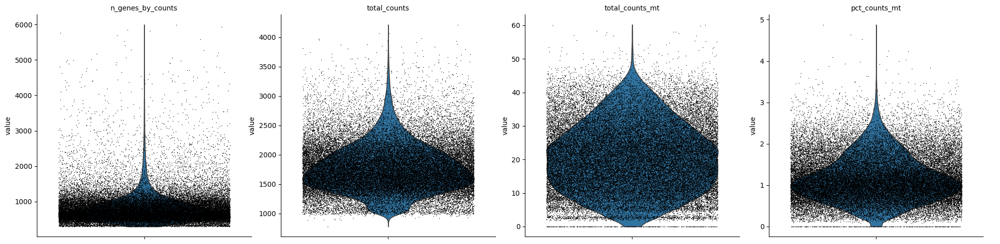

In [ ]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")

sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=None,
    log1p=False,
    inplace=True
)

print(adata.obs[["n_genes_by_counts", "total_counts"]].describe())
print(adata.obs[["n_genes_by_counts", "total_counts", "total_counts_mt", "pct_counts_mt"]].describe())

sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True
)


### **Computing and Plotting QC Statistics**

Here we compute basic statistics on total counts and gene counts across cells. Histograms are plotted to visualize the global distributions and inform decisions on appropriate QC cutoffs. Dotted lines show 2 standard deviations above and below the mean.


In [ ]:
# Calculating gene and count thresholds to apply outlier filtering

gene_stats = adata.obs['n_genes_by_counts'].describe()
count_stats = adata.obs['total_counts'].describe()

mean_genes = gene_stats['mean']
std_genes = adata.obs['n_genes_by_counts'].std()

mean_counts = count_stats['mean']
std_counts = adata.obs['total_counts'].std()

min_genes = max(mean_genes - 2 * std_genes, 300)
max_genes = mean_genes + 2 * std_genes

min_counts = max(mean_counts - 2 * std_counts, 500)
max_counts = mean_counts + 2 * std_counts

print(f"min_genes = {min_genes:.1f}, max_genes = {max_genes:.1f}")
print(f"min_counts = {min_counts:.1f}, max_counts = {max_counts:.1f}")

min_genes = 300.0, max_genes = 1672.8
min_counts = 958.3, max_counts = 2590.8


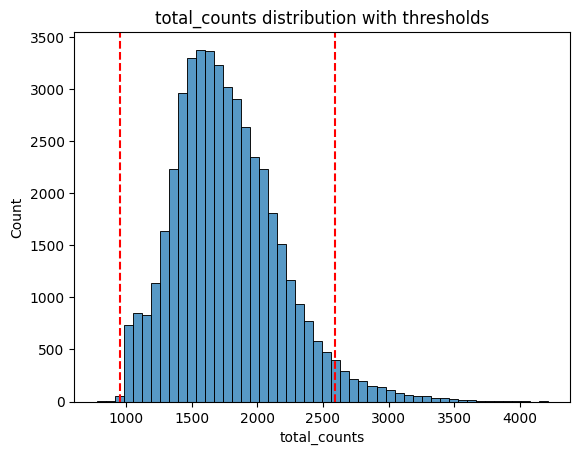

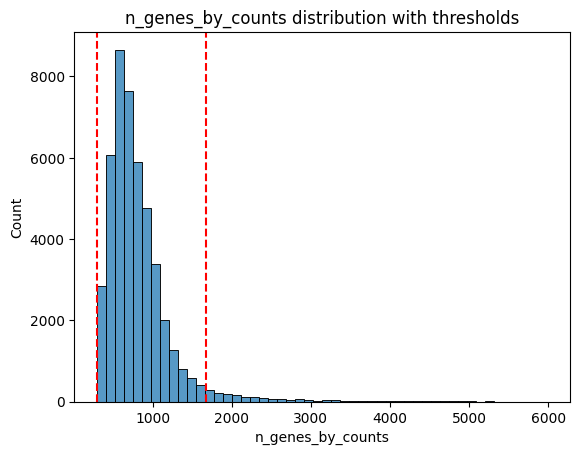

In [ ]:
sns.histplot(adata.obs['total_counts'], bins=50)
plt.axvline(min_counts, color='red', linestyle='--')
plt.axvline(max_counts, color='red', linestyle='--')
plt.title("total_counts distribution with thresholds")
plt.show()

sns.histplot(adata.obs['n_genes_by_counts'], bins=50)
plt.axvline(min_genes, color='red', linestyle='--')
plt.axvline(max_genes, color='red', linestyle='--')
plt.title("n_genes_by_counts distribution with thresholds")
plt.show()

### **Filtering Low-Quality Cells**

Based on insights from the earlier visualizations, this section filters out cells with abnormally low or high total counts, gene counts, or mitochondrial percentages. The resulting dataset is cleaner and more suitable for downstream analysis, plotted as violin plots below.

Original number of cells: 46022
Original number of genes: 18824
Original matrix sparsity: 0.9568
Cells removed (fewer than 300 genes): 3
Genes removed (expressed in <10 cells): 2282
Cells removed (mito % > 25): 0
Cells removed (extreme outliers): 2086
Cells removed (low total counts): 20
Filtered matrix sparsity: 0.9548
Final number of cells: 43913
Final number of genes: 16542


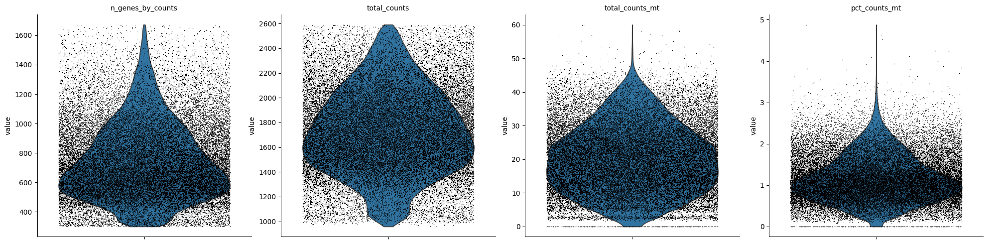

In [ ]:
import numpy as np

# Reusing much of the code from HW3

# Print number of cells and genes before filtering
print(f"Original number of cells: {adata.n_obs}")
print(f"Original number of genes: {adata.n_vars}")

# Find sparsity.
sparsity = 1 - (np.sum(adata.X != 0) / np.prod(adata.shape))
print(f"Original matrix sparsity: {sparsity:.4f}")

# Filter cells with <300 genes.
initial_n_cells = adata.n_obs
sc.pp.filter_cells(adata, min_genes=300)
filtered_cells_b = initial_n_cells - adata.n_obs
print(f"Cells removed (fewer than 300 genes): {filtered_cells_b}")

# Filter genes not expressed in > 10 cells.
initial_n_genes = adata.n_vars
sc.pp.filter_genes(adata, min_cells=10)
filtered_genes_c = initial_n_genes - adata.n_vars
print(f"Genes removed (expressed in <10 cells): {filtered_genes_c}")

# Filter cells with >25% mitochondrial content.
initial_n_cells_d = adata.n_obs
mito_filter = adata.obs['pct_counts_mt'] < 25
adata = adata[mito_filter].copy()
filtered_cells_d = initial_n_cells_d - adata.n_obs
print(f"Cells removed (mito % > 25): {filtered_cells_d}")

# Remove extreme outliers.
initial_n_cells_e = adata.n_obs
extreme_filter = (
    (adata.obs['n_genes_by_counts'] <= max_genes) &
    (adata.obs['total_counts'] <= max_counts)
)
adata = adata[extreme_filter].copy()
filtered_cells_e = initial_n_cells_e - adata.n_obs
print(f"Cells removed (extreme outliers): {filtered_cells_e}")

# Remove low-quality cells.
initial_n_cells_f = adata.n_obs
low_quality_filter = (
    (adata.obs['n_genes_by_counts'] >= min_genes) &
    (adata.obs['total_counts'] >= min_counts)
)
adata = adata[low_quality_filter].copy()
filtered_cells_f = initial_n_cells_f - adata.n_obs
print(f"Cells removed (low total counts): {filtered_cells_f}")

# Calculate new sparsity.
new_sparsity = 1 - (np.sum(adata.X != 0) / np.prod(adata.shape))
print(f"Filtered matrix sparsity: {new_sparsity:.4f}")

# Print number of cells and genes after filtering
print(f"Final number of cells: {adata.n_obs}")
print(f"Final number of genes: {adata.n_vars}")

# Plot QC metrics after filtering. 
sc.pl.violin(
    adata,
    ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'],
    jitter=0.4,
    multi_panel=True
)

---
---
---
---
# Differential Espression
---
---
---
---

## **Differential Expression and Marker Visualization**

This section explores differential gene expression and marker patterns across cell types and conditions in the single-cell COVID dataset. We preprocess metadata, visualize gene expression using PCA, UMAPs, and dot plots, and highlight genes of interest from the original paper.


### **Preprocessing Metadata for Downstream Analysis**

This section restores and standardizes metadata fields (`condition`, `sample_name`, `cell_type_name`) that were lost during data conversion from R. These annotations are essential for grouping and labeling in all subsequent analyses.


In [ ]:
def observe_cell_types(adata: AnnData):
    cell_type_mapping = {
        0: "Cytotoxic CD8 T cells",
        1: "Naive T cells",
        2: "NKs",
        3: "MAIT",
        4: "Activated CD4 T cells",
        5: "Naive B cells",
        6: "Plasma",
        7: "Memory B cells",
        8: "XCL+ NKs",
        9: "Cycling T cells",
        10: "Monocytes",
        11: "DCs",
        12: "Cycling Plasma",
        13: "Stem cells",
        14: "Megakaryocytes",
    }

    adata.obs["cell_type_name"] = adata.obs["cell_type"].map(cell_type_mapping)


def observe_condition(adata: AnnData):
    batch_to_condition = {
        0: "Ctrl-1",
        1: "Ctrl-2",
        2: "Ctrl-3",
        3: "IAV-1-D1",
        4: "IAV-1-D14",
        5: "IAV-2-D1",
        6: "IAV-2-D9",
        7: "COV-1-D1",
        8: "COV-1-D4",
        9: "COV-1-D16",
        10: "COV-2-D1",
        11: "COV-2-D4",
        12: "COV-2-D7",
        13: "COV-2-D10",
        14: "COV-2-D16",
        15: "COV-3-D1",
        16: "COV-3-D4",
        17: "COV-3-D16",
        18: "COV-4-D4",
        19: "COV-4-D16",
        20: "COV-5-D1",
        21: "COV-5-D7",
        22: "COV-5-D13",
    }

    adata.obs["sample_name"] = adata.obs["batch"].map(batch_to_condition)

    def categorize(sample: str):
        if sample.startswith("Ctrl"):
            return "Control"
        elif sample.startswith("COV"):
            return "COVID"
        elif sample.startswith("IAV"):
            return "IAV"
        else:
            return "Unknown"

    adata.obs["condition"] = adata.obs["sample_name"].apply(categorize)

def observe_cell_types(adata: AnnData):
    cell_type_mapping = {
        0: "Cytotoxic CD8 T cells",
        1: "Naive T cells",
        2: "NKs",
        3: "MAIT",
        4: "Activated CD4 T cells",
        5: "Naive B cells",
        6: "Plasma",
        7: "Memory B cells",
        8: "XCL+ NKs",
        9: "Cycling T cells",
        10: "Monocytes",
        11: "DCs",
        12: "Cycling Plasma",
        13: "Stem cells",
        14: "Megakaryocytes",
    }

    adata.obs["cell_type_name"] = adata.obs["cell_type"].map(cell_type_mapping)


In [4]:
observe_condition(adata)
observe_cell_types(adata)

gene_to_index = {
    gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)
}

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

### **Visualizing Global Structure with PCA**

Here we perform PCA on the log-normalized expression matrix to assess global variance across conditions and cell types. This helps in verifying batch structure and cell type separation at a high level.


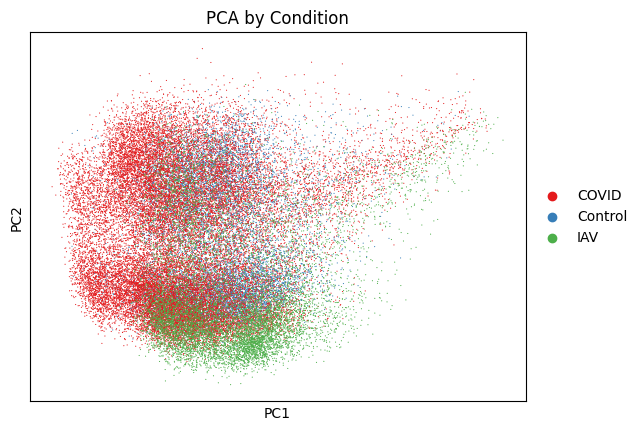

In [ ]:
sc.tl.pca(adata, svd_solver='arpack')

palette = ["#E41A1C", "#377EB8", "#4DAF4A"]
sc.pl.pca(adata, color="condition", title="PCA by Condition", palette=palette)

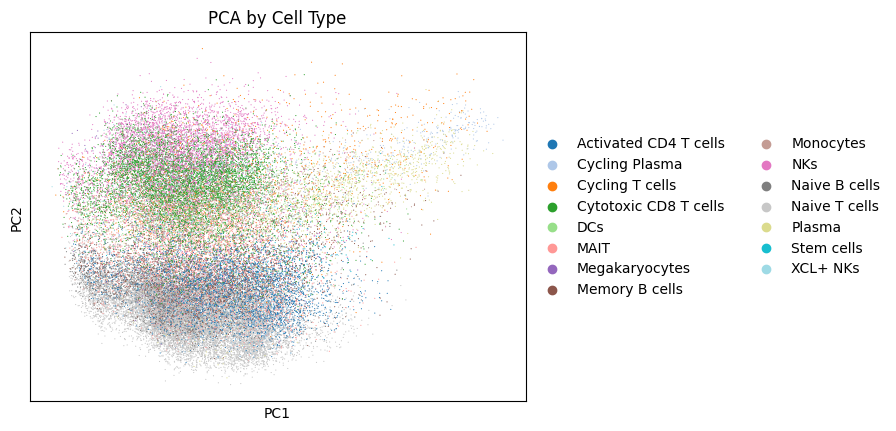

In [ ]:
sc.pl.pca(adata, color="cell_type_name", title="PCA by Cell Type", palette="tab20")

### **UMAP Embedding Highlighting Cell Types and Gene Expression**

We visualize the UMAP embedding colored by cell types and gene expression values. Gene-level coloring highlights expression patterns across the manifold, especially for genes emphasized in the original paper.


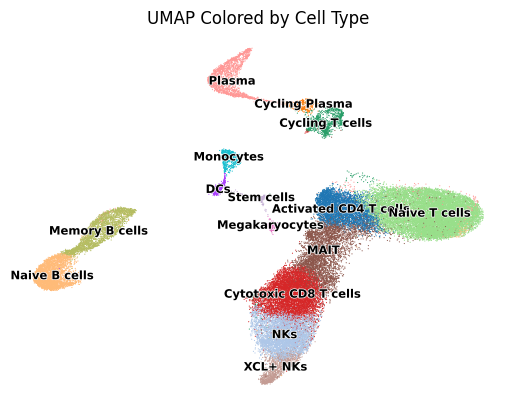

In [ ]:
sc.pl.umap(
    adata,
    color="cell_type_name",
    legend_loc="on data",
    title="UMAP Colored by Cell Type",
    frameon=False,
    legend_fontsize="small",
    legend_fontoutline=1
)

In [ ]:
genes = [
    "CNBP", "PFDN5", "BTF3", "SAP18", "ZFP36", "ZFP36L2", "IL10RB", "IL6R", "IL6ST",
    "IL27RA", "IL17RA", "IL2RA", "IL10RA", "IL7R", "IFNAR1", "TNFSF14", "STAT1", "IRF3",
    "TNFSF10", "TNF", "IL23A", "IFNG", "STAT3", "CHD1", "REL", "RUNX3", "BCLAF1", "JUND",
    "NFKB1", "PHF3", "CD69", "IL4R"
]

gene_to_index = {
    gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)
}
gene_indices = [gene_to_index[g] for g in genes]

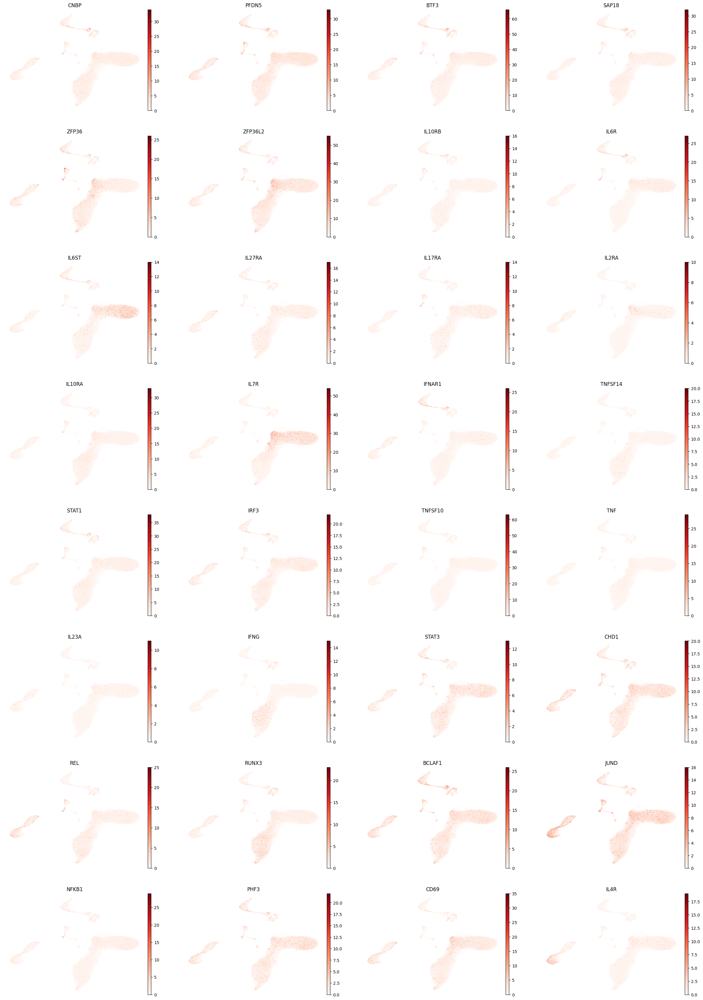

In [ ]:
sc.pl.umap(
    adata,
    color=gene_indices,
    title=[f"{g}" for g in genes],
    ncols=4,
    cmap="Reds",
    use_raw=True,
    frameon=False
)


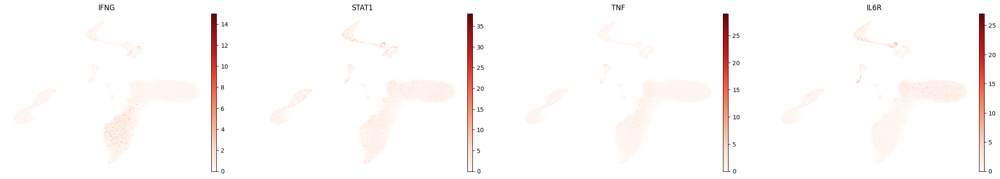

In [ ]:
# These genes are highlighted in the paper, and subsetting them makes
# the resulting plots much cleaner.
primary_genes = [
    "IFNG", "STAT1", "TNF", "IL6R",
]

primary_gene_indices = [gene_to_index[g] for g in primary_genes]

sc.pl.umap(
    adata,
    color=primary_gene_indices,        
    title=[f"{g}" for g in primary_genes],
    ncols=4,
    cmap="Reds",
    use_raw=True,
    frameon=False
)

### **Dot Plot Comparison of Marker Gene Expression Across Samples**

Dot plots summarize both the mean expression and percentage of expressing cells for select genes. These plots replicate figure panels from the original paper and provide insight into condition-specific transcriptional signatures.


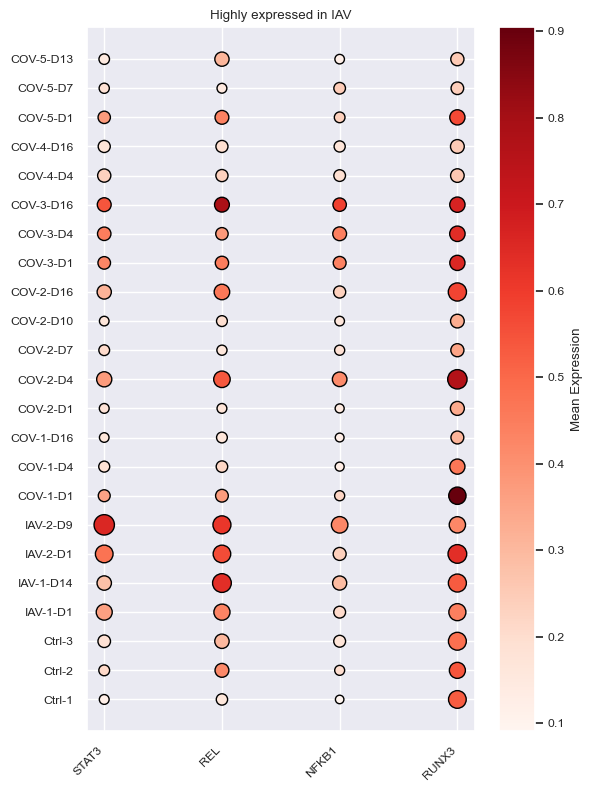

In [ ]:
# Define genes for "Highly expressed in IAV"
genes = ["STAT3", "REL", "NFKB1", "RUNX3"]

# Used to match the same order as the figure in the paper
sample_order = [
    "COV-5-D13", "COV-5-D7", "COV-5-D1",
    "COV-4-D16", "COV-4-D4",
    "COV-3-D16", "COV-3-D4", "COV-3-D1",
    "COV-2-D16", "COV-2-D10", "COV-2-D7", "COV-2-D4", "COV-2-D1",
    "COV-1-D16", "COV-1-D4", "COV-1-D1",
    "IAV-2-D9", "IAV-2-D1",
    "IAV-1-D14", "IAV-1-D1",
    "Ctrl-3", "Ctrl-2", "Ctrl-1"
]

gene_to_index = {gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)}
gene_indices = [gene_to_index[g] for g in genes]

adata_filtered = adata[adata.obs["sample_name"].isin(sample_order)].copy()
X = adata_filtered.raw[:, gene_indices].X
X = X.toarray() if hasattr(X, "toarray") else X

df_expr = pd.DataFrame(X, columns=genes)
df_expr["sample_name"] = adata_filtered.obs["sample_name"].values

plot_data = []
for sample in sample_order:
    subset = df_expr[df_expr["sample_name"] == sample]
    for gene in genes:
        mean_expr = subset[gene].mean()
        pct_expr = (subset[gene] > 0).sum() / subset.shape[0]
        plot_data.append({
            "sample": sample,
            "gene": gene,
            "mean_expr": mean_expr,
            "pct_expr": pct_expr
        })

plot_df = pd.DataFrame(plot_data)

plt.figure(figsize=(6, 8))
scatter = plt.scatter(
    x=plot_df["gene"],
    y=plot_df["sample"],
    s=plot_df["pct_expr"] * 500,
    c=plot_df["mean_expr"],
    cmap="Reds",
    edgecolors="black"
)
plt.xticks(rotation=45, ha="right")
plt.gca().invert_yaxis()
cbar = plt.colorbar(scatter)
cbar.set_label("Mean Expression")
plt.title("Highly expressed in IAV")
plt.tight_layout()
plt.show()


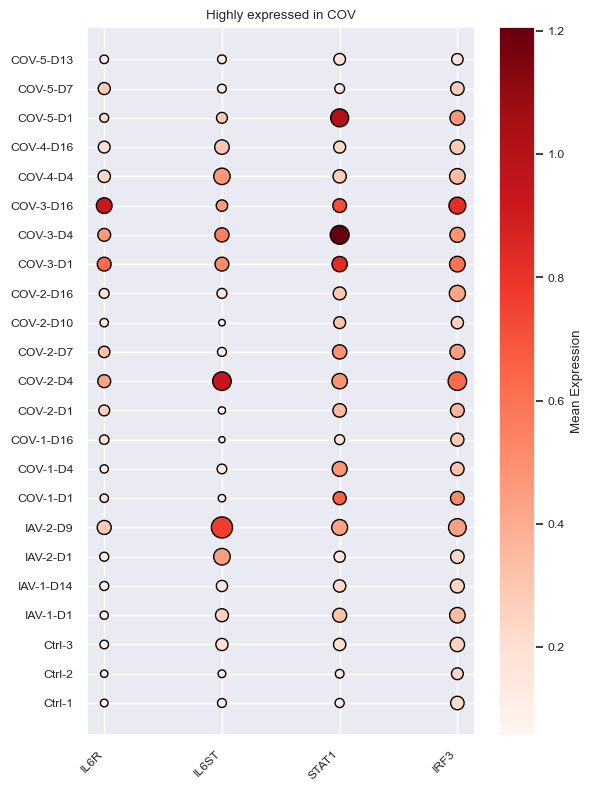

In [ ]:
# Define genes for "Highly expressed in COV"
genes = ["IL6R", "IL6ST", "STAT1", "IRF3"]

gene_to_index = {gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)}
gene_indices = [gene_to_index[g] for g in genes]

adata_filtered = adata[adata.obs["sample_name"].isin(sample_order)].copy()
X = adata_filtered.raw[:, gene_indices].X
X = X.toarray() if hasattr(X, "toarray") else X

df_expr = pd.DataFrame(X, columns=genes)
df_expr["sample_name"] = adata_filtered.obs["sample_name"].values

plot_data = []
for sample in sample_order:
    subset = df_expr[df_expr["sample_name"] == sample]
    for gene in genes:
        mean_expr = subset[gene].mean()
        pct_expr = (subset[gene] > 0).sum() / subset.shape[0]
        plot_data.append({
            "sample": sample,
            "gene": gene,
            "mean_expr": mean_expr,
            "pct_expr": pct_expr
        })

plot_df = pd.DataFrame(plot_data)

plt.figure(figsize=(6, 8))
scatter = plt.scatter(
    x=plot_df["gene"],
    y=plot_df["sample"],
    s=plot_df["pct_expr"] * 500,
    c=plot_df["mean_expr"],
    cmap="Reds",
    edgecolors="black"
)
plt.xticks(rotation=45, ha="right")
plt.gca().invert_yaxis()
cbar = plt.colorbar(scatter)
cbar.set_label("Mean Expression")
plt.title("Highly expressed in COV")
plt.tight_layout()
plt.show()


### **Violin Plots of Canonical Marker Genes by Cell Type**

This section visualizes expression distributions of key marker genes across annotated cell types, helping to validate the cell-type labeling and reveal patterns consistent with immune activation or suppression. The resulting plots relicate figures from the original paper


In [ ]:
sc.pp.scale(adata, max_value=10)

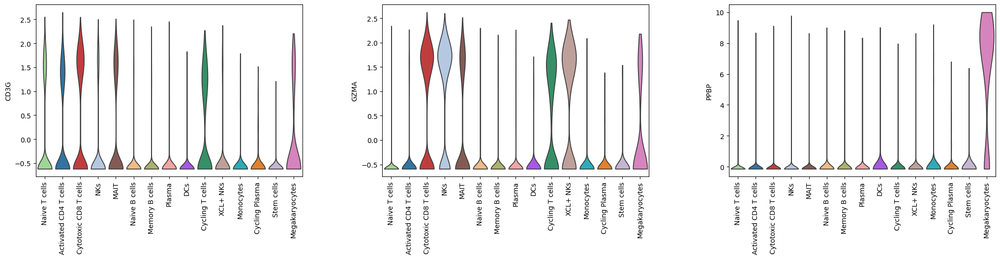

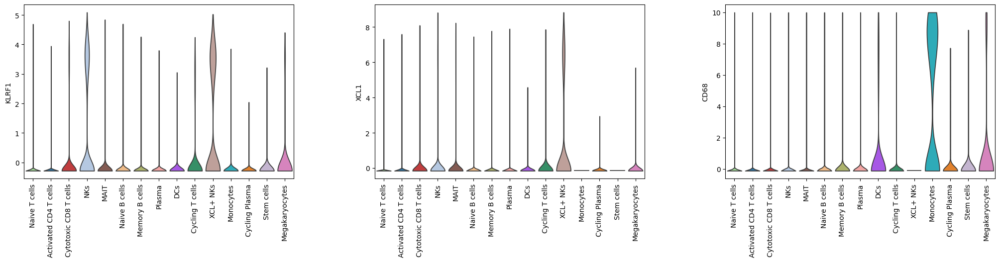

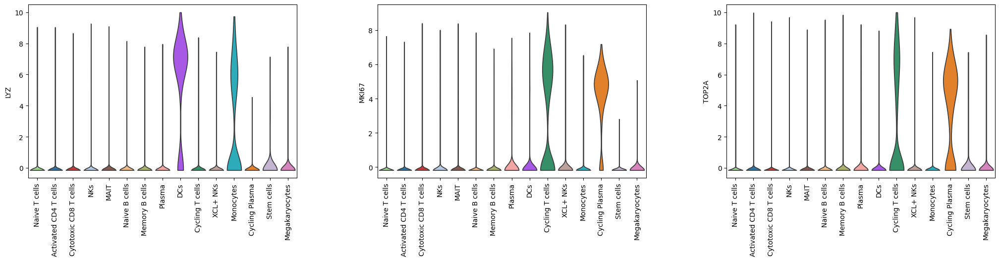

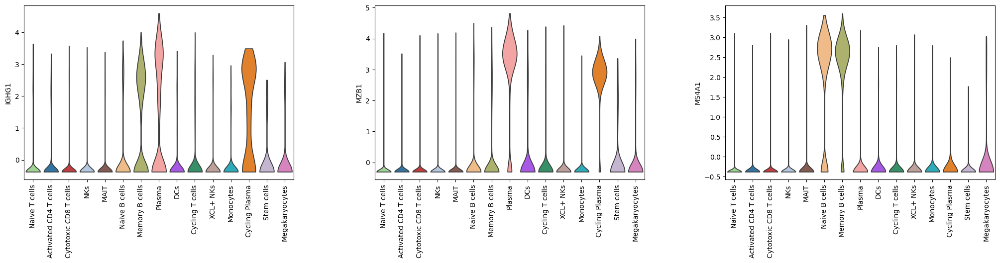

In [ ]:
marker_genes = ["CD3G", "GZMA", "PPBP", "KLRF1", "XCL1", "CD68", 
                "LYZ", "MKI67", "TOP2A", "IGHG1", "MZB1", "MS4A1"]

gene_to_index = {
    gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)
}

marker_gene_indices = [str(gene_to_index[g]) for g in marker_genes]

ncols = 3
nrows = math.ceil(len(marker_genes) / ncols)



# Plot manually in subgroups
for i in range(nrows):
    start = i * ncols
    end = (i+1) * ncols
    subset_genes = marker_genes[start:end]
    
    sc.pl.violin(
        adata,
        keys=subset_genes,
        # log=True,
        groupby="cell_type_name",
        order=[
            "Naive T cells",
            "Activated CD4 T cells",
            "Cytotoxic CD8 T cells",
            "NKs",
            "MAIT",
            "Naive B cells",
            "Memory B cells",
            "Plasma",
            "DCs",
            "Cycling T cells",
            "XCL+ NKs",
            "Monocytes",
            "Cycling Plasma",
            "Stem cells",
            "Megakaryocytes"
        ],
        stripplot=False,
        multi_panel=True,
        rotation=90,
        jitter=0.4,
        size=1.5,
        use_raw=False,
    )

---
---
---
---
# Further Analysis
---
---
---
---

## **Clustering and Apoptosis Analysis**

This section investigates the relationship between cell clustering and apoptosis in a single-cell COVID dataset. We use Leiden clustering to segment subpopulations and compute Adjusted Rand Index (ARI) to evaluate alignment with clinical condition labels. Additionally, we compute apoptosis scores and visualize them alongside clustering metrics to uncover biological trends.


In [ ]:
from sklearn.metrics import adjusted_rand_score

### **Clustering Cells by Cell Type Using Leiden Algorithm**

This section applies Leiden clustering to each cell type subset individually, dynamically adjusting the resolution to generate ~3 clusters per type. We visualize clustering vs. condition labels and calculate the Adjusted Rand Index (ARI) to measure overlap between unsupervised clusters and experimental conditions.


Trying resolution: 0.3
Number of clusters: 5
Trying resolution: 0.24
Number of clusters: 5
Trying resolution: 0.192
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 4
Trying resolution: 0.24
Number of clusters: 4
Trying resolution: 0.192
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 5
Trying resolution: 0.24
Number of clusters: 4
Trying resolution: 0.192
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 4
Trying resolution: 0.24
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 4
Trying resolution: 0.24
Number of clusters: 4
Trying resolution: 0.192
Number of clusters: 4
Trying resolution: 0.15360000000000001
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 3
Trying resolution: 0.3
Number of clusters: 4
Trying resolution: 0.24
Number of clusters: 4
Trying resolution: 0.192


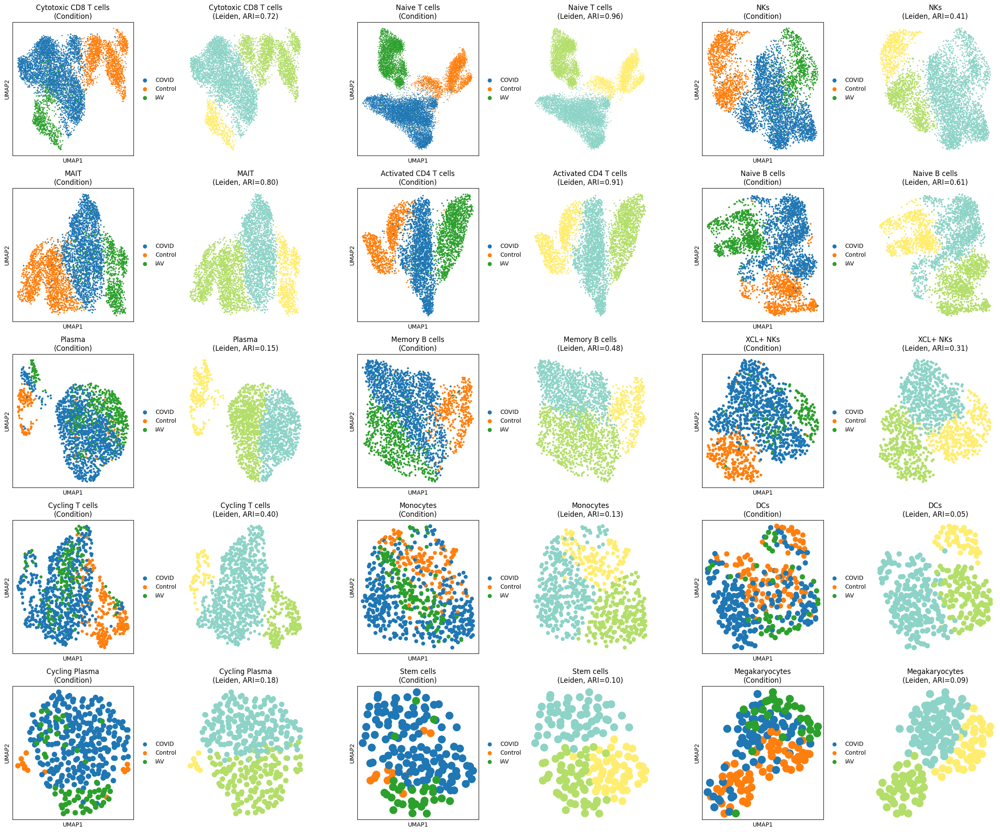

In [ ]:
cell_type_mapping = {
    0: "Cytotoxic CD8 T cells",
    1: "Naive T cells",
    2: "NKs",
    3: "MAIT",
    4: "Activated CD4 T cells",
    5: "Naive B cells",
    6: "Plasma",
    7: "Memory B cells",
    8: "XCL+ NKs",
    9: "Cycling T cells",
    10: "Monocytes",
    11: "DCs",
    12: "Cycling Plasma",
    13: "Stem cells",
    14: "Megakaryocytes",
}

target_n_clusters = 3
initial_resolution = 0.3
tolerance = 1
max_iterations = 10

n_cells = len(cell_type_mapping)
ncols = 6
nrows = (n_cells + 2) // 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
axes = axes.flatten()

ari_scores = {}

for i, (cell_id, cell_name) in enumerate(cell_type_mapping.items()):
    subset = adata[adata.obs["cell_type"] == cell_id].copy()
    
    if subset.n_obs < 5:
        continue
    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)
    sc.pp.pca(subset)
    sc.pp.neighbors(subset)
    sc.tl.umap(subset)

    resolution = initial_resolution
    for _ in range(max_iterations):
        print(f"Trying resolution: {resolution}")
        sc.tl.leiden(subset, resolution=resolution, key_added='leiden_temp')
        n_clusters = len(np.unique(subset.obs['leiden_temp']))
        print(f"Number of clusters: {n_clusters}")
        if n_clusters == target_n_clusters:
            print("="*50)
            break
        resolution *= 1.2 if n_clusters < target_n_clusters else 0.8
        
    subset.obs['leiden'] = subset.obs['leiden_temp']

    labels_true = subset.obs["condition"].values
    labels_pred = subset.obs["leiden"].values
    ari = adjusted_rand_score(labels_true, labels_pred)
    ari_scores[cell_name] = ari

    ax_cond = axes[2 * i]
    sc.pl.umap(subset, color="condition", ax=ax_cond, show=False,
               title=f"{cell_name}\n(Condition)")

    ax_lei = axes[2 * i + 1]
    sc.pl.umap(subset, color="leiden", ax=ax_lei, show=False,
               title=f"{cell_name}\n(Leiden, ARI={ari:.2f})",
               palette='Set3', legend_loc=None, frameon=False)

for j in range(2 * n_cells, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### **Scoring Cells for Apoptosis and Activation Signatures**

We compute apoptosis and activation scores for each cell using curated gene sets and visualize their distribution across the UMAP embedding. This quantifies stress and signaling activity within each condition and cell type.


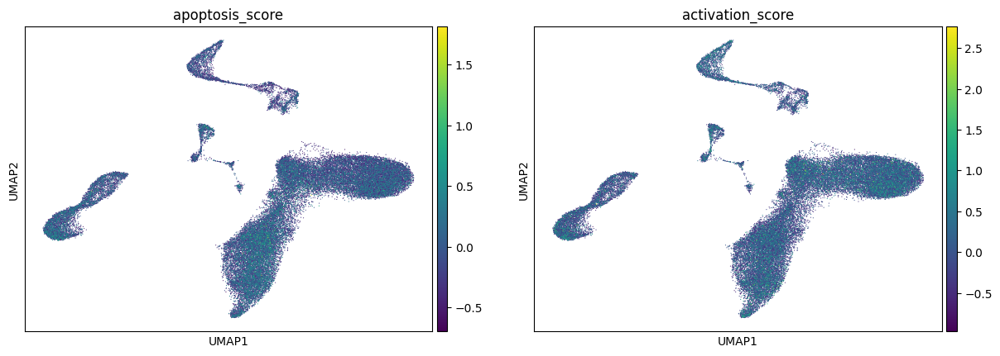

In [ ]:
apoptosis_genes = ["XAF1", "TNF", "FAS", "BCL2L11", "CASP3"]
activation_genes = ["STAT1", "IL6R", "IRF3", "ISG15", "IFI44L"]

sc.tl.score_genes(adata, apoptosis_genes, score_name='apoptosis_score', use_raw=False)
sc.tl.score_genes(adata, activation_genes, score_name='activation_score', use_raw=False)

sc.pl.umap(adata, color=['apoptosis_score', 'activation_score'])


### **Comparing Condition Labels and Apoptosis Scores on UMAP**

Here we generate paired UMAPs for each cell type, colored by condition and apoptosis score. This reveals how apoptotic signaling differs across disease states and whether it maps to spatial structure in the low-dimensional embedding.


Scoring based on genes: ['XAF1', 'TNF', 'FAS', 'BCL2L11', 'CASP3']


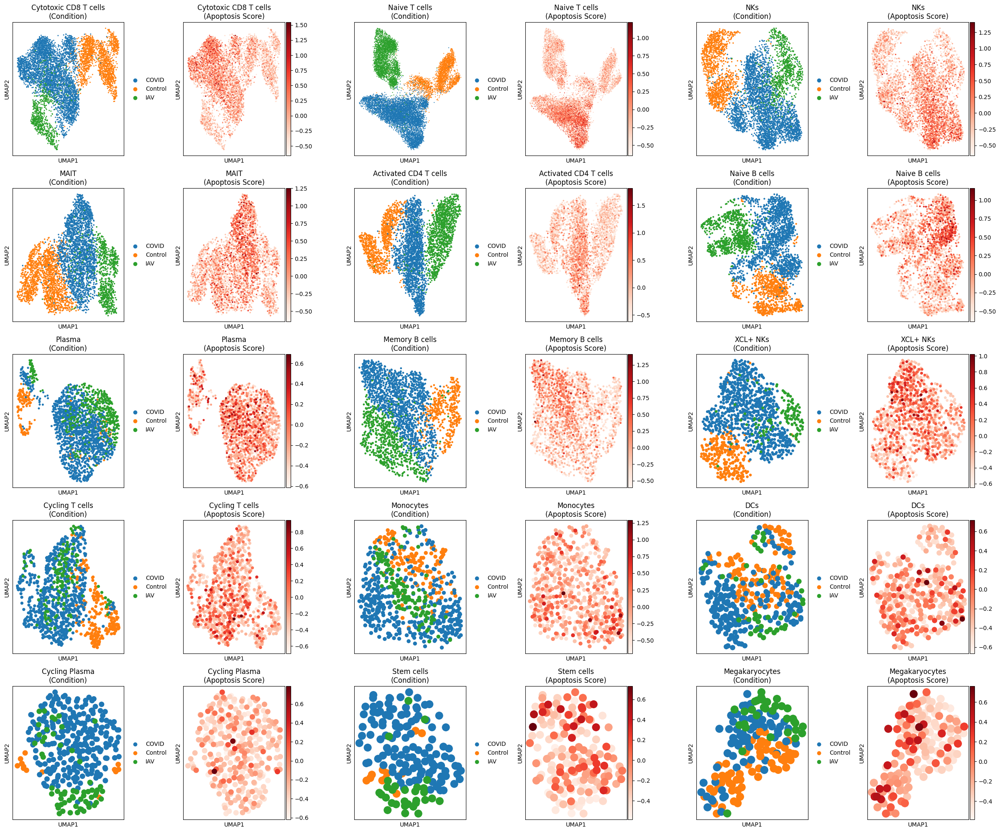

In [ ]:
cell_type_mapping = {
    0: "Cytotoxic CD8 T cells",
    1: "Naive T cells",
    2: "NKs",
    3: "MAIT",
    4: "Activated CD4 T cells",
    5: "Naive B cells",
    6: "Plasma",
    7: "Memory B cells",
    8: "XCL+ NKs",
    9: "Cycling T cells",
    10: "Monocytes",
    11: "DCs",
    12: "Cycling Plasma",
    13: "Stem cells",
    14: "Megakaryocytes",
}

apoptosis_genes = ["XAF1", "TNF", "FAS", "BCL2L11", "CASP3"]

gene_to_index = {gene: idx for idx, gene in enumerate(adata.raw.var["_index"].values)}
valid_apoptosis_genes = [g for g in apoptosis_genes if g in gene_to_index]

print("Scoring based on genes:", valid_apoptosis_genes)

sc.tl.score_genes(adata, valid_apoptosis_genes, score_name="apoptosis_score", use_raw=False)

n_cells = len(cell_type_mapping)
ncols = 6
nrows = (n_cells + 2) // 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
axes = axes.flatten()

for i, (cell_id, cell_name) in enumerate(cell_type_mapping.items()):
    subset = adata[adata.obs["cell_type"] == cell_id].copy()

    if subset.n_obs < 5:
        continue

    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)
    sc.pp.pca(subset)
    sc.pp.neighbors(subset)
    sc.tl.umap(subset)

    ax_cond = axes[2 * i]
    sc.pl.umap(subset, color="condition", ax=ax_cond, show=False,
               title=f"{cell_name}\n(Condition)")

    ax_apo = axes[2 * i + 1]
    sc.pl.umap(subset, color="apoptosis_score", ax=ax_apo, show=False,
               title=f"{cell_name}\n(Apoptosis Score)",
               color_map="Reds")

for j in range(2 * n_cells, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### **Apoptosis vs. Clustering Agreement Across Cell Types**

We summarize the analysis by plotting mean apoptosis score per condition and ARI per cell type. This helps reveal how closely apoptosis trends align with unsupervised clustering outcomes, identifying cell types with coherent biological structure across conditions.


In [ ]:
cell_type_mapping = {
    0: "Cytotoxic CD8 T cells",
    1: "Naive T cells",
    2: "NKs",
    3: "MAIT",
    4: "Activated CD4 T cells",
    5: "Naive B cells",
    6: "Plasma",
    7: "Memory B cells",
    8: "XCL+ NKs",
    9: "Cycling T cells",
    10: "Monocytes",
    11: "DCs",
    12: "Cycling Plasma",
    13: "Stem cells",
    14: "Megakaryocytes",
}

target_n_clusters = 3
initial_resolution = 0.3
tolerance = 1
max_iterations = 10

cell_types = []
apoptosis_covid = []
apoptosis_control = []
apoptosis_iav = []
ari_scores = []

for cell_id, cell_name in cell_type_mapping.items():
    print(f"Analyzing cell id: {cell_id}")
    subset = adata[adata.obs["cell_type"] == cell_id].copy()

    if subset.n_obs < 5:
        continue

    sc.pp.normalize_total(subset, target_sum=1e4)
    sc.pp.log1p(subset)
    sc.pp.pca(subset)
    sc.pp.neighbors(subset)
    sc.tl.umap(subset)

    resolution = initial_resolution
    for _ in range(max_iterations):
        sc.tl.leiden(subset, resolution=resolution, key_added='leiden_temp')
        n_clusters = len(np.unique(subset.obs['leiden_temp']))
        if n_clusters == target_n_clusters:
            break
        resolution *= 1.2 if n_clusters < target_n_clusters else 0.8

    subset.obs['leiden_final'] = subset.obs['leiden_temp']

    covid_mean = subset.obs.loc[subset.obs["condition"] == "COVID", "apoptosis_score"].mean()
    control_mean = subset.obs.loc[subset.obs["condition"] == "Control", "apoptosis_score"].mean()
    iav_mean = subset.obs.loc[subset.obs["condition"] == "IAV", "apoptosis_score"].mean()

    labels_true = subset.obs["condition"].values
    labels_pred = subset.obs["leiden_final"].values
    ari = adjusted_rand_score(labels_true, labels_pred)

    cell_types.append(cell_name)
    apoptosis_covid.append(covid_mean)
    apoptosis_control.append(control_mean)
    apoptosis_iav.append(iav_mean)
    ari_scores.append(ari)

df = pd.DataFrame({
    "Cell Type": cell_types,
    "COVID Apoptosis": apoptosis_covid,
    "Control Apoptosis": apoptosis_control,
    "IAV Apoptosis": apoptosis_iav,
    "ARI": ari_scores
})

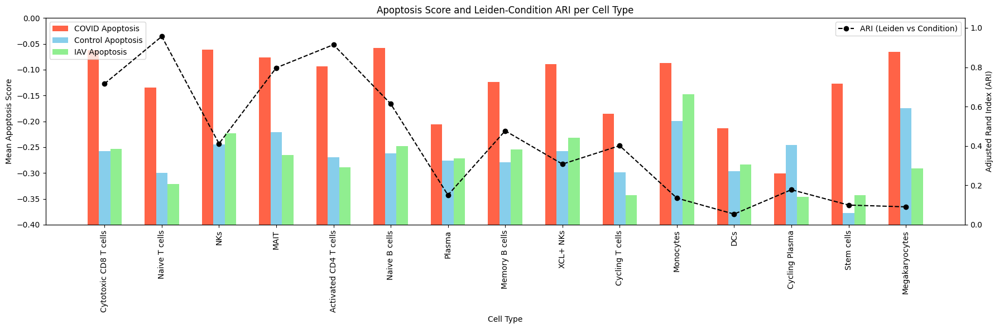

In [ ]:
bar_width = 0.2
x = np.arange(len(df))

min_y = -0.4

fig, ax1 = plt.subplots(figsize=(18, 6))

ax1.bar(x - bar_width, df["COVID Apoptosis"] - min_y, width=bar_width, 
        bottom=min_y, label="COVID Apoptosis", color='tomato')
ax1.bar(x, df["Control Apoptosis"] - min_y, width=bar_width, 
        bottom=min_y, label="Control Apoptosis", color='skyblue')
ax1.bar(x + bar_width, df["IAV Apoptosis"] - min_y, width=bar_width, 
        bottom=min_y, label="IAV Apoptosis", color='lightgreen')

ax1.set_ylim(min_y, 0)

ax1.set_ylabel("Mean Apoptosis Score")
ax1.set_xlabel("Cell Type")
ax1.set_xticks(x)
ax1.set_xticklabels(df["Cell Type"], rotation=90)

ax1.legend(loc="upper left")

ax2 = ax1.twinx()
ax2.plot(x, df["ARI"], color="black", marker="o", linestyle="--", label="ARI (Leiden vs Condition)")
ax2.set_ylabel("Adjusted Rand Index (ARI)")
ax2.set_ylim(0, 1.05)
ax2.legend(loc="upper right")

plt.title("Apoptosis Score and Leiden-Condition ARI per Cell Type")
plt.tight_layout()
plt.show()
